## LOADING DATA AND IMPORTING/INSTALLING LIBRARIES

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pyrsm as rsm

In [2]:
## Install Library 1 - 

!pip install pgeocode

In [3]:
## Install Library - 2
!pip install folium

In [4]:
import os 
os.getcwd()



'/home/jovyan/Desktop/rsm-mgta455-intuit-2025-group-9'

In [5]:

intuit75k = pd.read_parquet("data/intuit75k.parquet")

intuit75k.head()

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,owntaxprod,upgraded,res1,training,res1_yes
0,1,94553,18,Male,0,2,109.5,5,12,0,0,0,No,1,0
1,2,53190,10,Unknown,0,1,69.5,4,3,0,0,0,No,0,0
2,3,37091,8,Male,0,4,93.0,14,29,0,0,1,No,0,0
3,4,02125,1,Male,0,1,22.0,17,1,0,0,0,No,1,0
4,5,60201,11,Male,0,1,24.5,2,3,0,0,0,No,0,0


## NULL VALUE CHECK

In [6]:
## First Check - Null Values - Let us do the check on the full data to ensure that there is no issue when we are using the data to put it 
## in the ML model

intuit75k.isnull().sum()

id            0
zip5          0
zip_bins      0
sex           0
bizflag       0
numords       0
dollars       0
last          0
sincepurch    0
version1      0
owntaxprod    0
upgraded      0
res1          0
training      0
res1_yes      0
dtype: int64

There seems to be no null values so we should be good for our analysis now

## DATA VISUALIZATIONS AND INSIGHTS

### DISTRIBUTION PLOTS

<Figure size 1000x500 with 0 Axes>

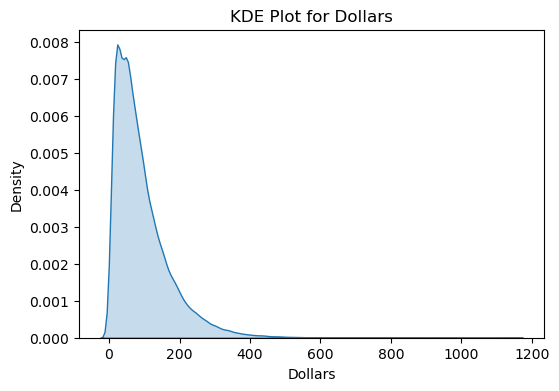

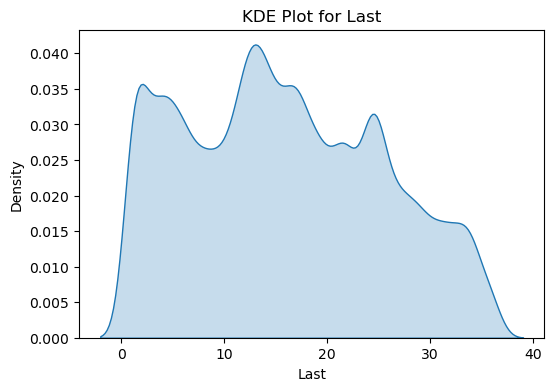

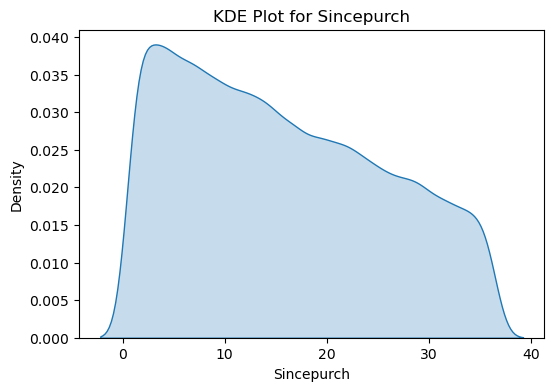

In [7]:
## Now looking at the data - Lets Do some basic visualizations first:

## Starting of with some numerical analysis - for a basic KDE plot

import seaborn as sns

# Set figure size
plt.figure(figsize=(10, 5))

# List of variables to plot
variables = ["dollars", "last", "sincepurch"]

# Loop through variables and generate KDE plots
for var in variables:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(intuit75k[var].dropna(), fill=True)  # Drop NaN values for safe plotting
    plt.title(f"KDE Plot for {var.capitalize()}")
    plt.xlabel(var.capitalize())
    plt.ylabel("Density")
    plt.show()

Analysis:
    
1. Months since last purchase: The distribution is multi-modal, meaning there are multiple peaks. This suggests different customer 
    behavior groups (recent buyers vs. long-time inactive customers). Businesses that haven't bought for 2+ years might require a special 
    win-back campaign or could be possible that they have switched to a competitor. 
    
2. Dollars Spent: The distribution is right-skewed, meaning most businesses spend a small amount, but a few spend significantly more. I should
    and the model should try to avoid sending mails to very low spending customers.
    
3. Businesses that recently bought QuickBooks are likely still engaged and may respond better to upgrades. Wave-2 should focus on businesses with low "sincepurch" values.

### HEATMAP

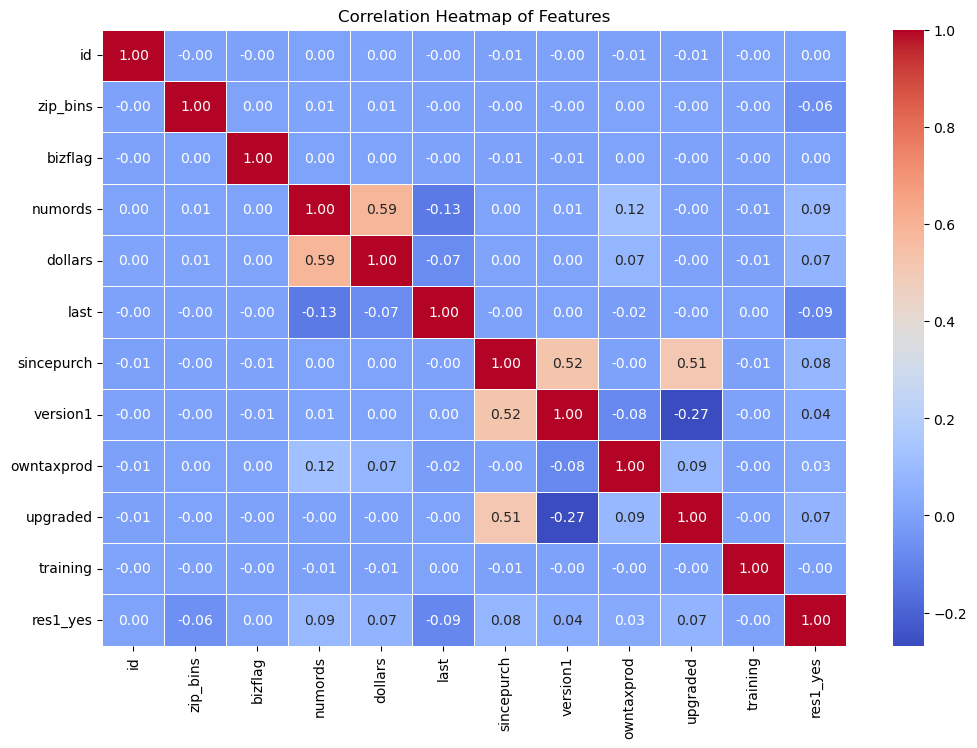

In [8]:
## Lets start off with some correlation analysis :

# Selecting only numerical columns for correlation
numeric_intuit75k = intuit75k.select_dtypes(include=['number'])

# Compute correlation matrix
corr_matrix = numeric_intuit75k.corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap of Features")
plt.show()

Analysis :

1. The chart does not show a **strong correlation** across all variables, but we can still draw insights to identify **target customers** for wave-2 mailing.  

2. **Customer tenure significantly impacts upgrade behavior**:  
   - Customers who have been using QuickBooks for a long time (since purchase) tend to fall into two key groups:  
     **A.** Those who have remained on Version 1 and have **not upgraded** (**+0.52 correlation**).  
     **B.** Those who have **already upgraded** to Version 2 (**+0.51 correlation**).


### GEOGRAPHICAL INSIGHTS

In [9]:
import pandas as pd
import folium
import pgeocode


# Aggregate response rates by ZIP code
zip_response = intuit75k.groupby("zip5")["res1_yes"].mean().reset_index()
zip_response.columns = ["zip5", "response_rate"]

# Use pgeocode to get latitude and longitude for each ZIP
nomi = pgeocode.Nominatim("us")
zip_response["latitude"] = zip_response["zip5"].apply(lambda x: nomi.query_postal_code(x).latitude)
zip_response["longitude"] = zip_response["zip5"].apply(lambda x: nomi.query_postal_code(x).longitude)

# Drop rows where lat/lon couldn't be found
zip_response = zip_response.dropna(subset=["latitude", "longitude"])

# Create a folium map centered on the U.S.
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# Add ZIP code markers with response rates
for _, row in zip_response.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=5,
        color="blue",
        fill=True,
        fill_color="green" if row["response_rate"] > 0.3 else "red",
        fill_opacity=0.6,
        popup=f"ZIP: {row['zip5']}, Response Rate: {row['response_rate']:.2f}",
    ).add_to(m)

# Save and display the map
m.save("zip_response_map.html")
m


Analysis :
    
1. The highest density of responses is seen in the U.S. and select European cities. The sample may or may not be bias and it could be possible
    that Intuits major market is in the US only.
    
2. Response rate does show that urban areas California, Texas, and New York could be better target area, but coming to a conclusion directly
    might be off since population of different states vary and it is possible the sample is small or biased that we cannot make a judgement on this

### HYPOTHESIS TESTING

Does Gender have an effect on the response rate:


    Null Hypothesis (H₀): The response rate is the same across all gender categories (Male, Female, Unknown).
    Alternative Hypothesis (H₁): At least one gender category has a significantly different response rate.

STEP 1: Perform Statistical Test on Gender

In [10]:
## Statistical Analysis - 

from scipy.stats import f_oneway

# Group response rates by gender
male_responses = intuit75k[intuit75k["sex"] == "Male"]["res1_yes"]
female_responses = intuit75k[intuit75k["sex"] == "Female"]["res1_yes"]
unknown_responses = intuit75k[intuit75k["sex"] == "Unknown"]["res1_yes"]

# Perform ANOVA test
f_stat, p_value = f_oneway(male_responses, female_responses, unknown_responses)

# Print results
print(f"F-statistic: {f_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation
if p_value < 0.05:
    print("Reject H₀: There is a significant difference in response rates between genders.")
else:
    print("Fail to reject H₀: No significant difference in response rates between genders.")




F-statistic: 0.5138, P-value: 0.5982
Fail to reject H₀: No significant difference in response rates between genders.


STEP 2: Perform Post-Hoc Analysis

/tmp/ipykernel_29165/21880073.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  gender_response = intuit75k.groupby("sex")["res1_yes"].mean().reset_index()
/tmp/ipykernel_29165/21880073.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="sex", y="res1_yes", data=gender_response, palette="coolwarm")


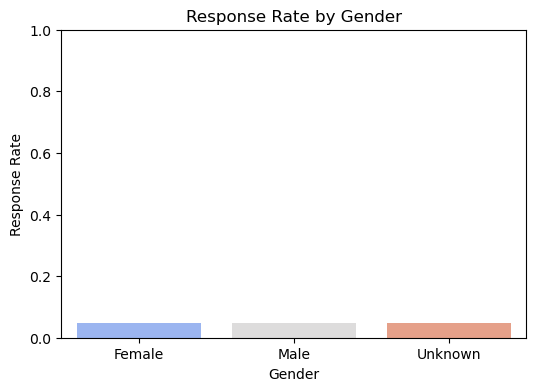

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt



# Compute mean response rate for each gender
intuit75k["res1_yes"] = intuit75k["res1_yes"].astype(int)
gender_response = intuit75k.groupby("sex")["res1_yes"].mean().reset_index()

# Create a bar plot
plt.figure(figsize=(6, 4))
sns.barplot(x="sex", y="res1_yes", data=gender_response, palette="coolwarm")

# Add labels and title
plt.xlabel("Gender")
plt.ylabel("Response Rate")
plt.title("Response Rate by Gender")
plt.ylim(0, 1)

# Show the chart
plt.show()


Analysis:
    
1. Gender should NOT be a key factor in Wave-2 targeting. Since response rates are similar across genders, there is no need to personalize 
mailings based on gender. Focusing on other factors (e.g., spending behavior, recency of purchase) will be more effective.

2. No need to create gender-specific messaging or segment campaigns by gender.

Does amount have an effect on the response rate:


    Null Hypothesis (H₀): No significant difference between spend levels
    Alternative Hypothesis (H₁): Significant difference between spend levels

STEP 1: Perform Statistical Test and come to a conclusion

In [12]:
from scipy.stats import ttest_ind

# Define high and low spenders (median split)
median_spend = intuit75k["dollars"].median()
high_spenders = intuit75k[intuit75k["dollars"] >= median_spend]["res1_yes"]
low_spenders = intuit75k[intuit75k["dollars"] < median_spend]["res1_yes"]

# Perform independent t-test
t_stat, p_value = ttest_ind(high_spenders, low_spenders, equal_var=False)

# Print results
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation
if p_value < 0.05:
    print("Reject H₀: High spenders have a significantly higher response rate.")
else:
    print("Fail to reject H₀: No significant difference between spend levels.")


T-statistic: 12.2985, P-value: 0.0000
Reject H₀: High spenders have a significantly higher response rate.


Analysis:
     
1. High-spending customers respond at a significantly higher rate than low spenders, indicating that Wave-2 marketing should prioritize high-value customers to maximize conversions. 
2. These users are more likely to engage with premium upgrade offers, exclusive deals, and personalized incentives, making them ideal for upselling opportunities. To optimize costs, reducing direct mail efforts for low-spending customers.

Response Rate by TurboTax Product Ownership:

    Null Hypothesis (H₀): No significant difference in response rates based on Product Ownership
    Alternative Hypothesis (H₁): Significant difference in response rates based on Product Ownership

STEP 1: Perform Statistical Test on Response Rate and Product Ownership

In [13]:
# Split data into TurboTax owners and non-owners
tax_users = intuit75k[intuit75k["owntaxprod"] == 1]["res1_yes"]
non_tax_users = intuit75k[intuit75k["owntaxprod"] == 0]["res1_yes"]

# Perform independent t-test
t_stat, p_value = ttest_ind(tax_users, non_tax_users, equal_var=False)

# Print results
print(f"T-statistic: {t_stat:.4f}, P-value: {p_value:.4f}")

# Interpretation
if p_value < 0.05:
    print("Reject H₀: TurboTax users have a significantly higher response rate.")
else:
    print("Fail to reject H₀: No significant difference in response rates.")


T-statistic: 6.1570, P-value: 0.0000
Reject H₀: TurboTax users have a significantly higher response rate.


/tmp/ipykernel_29165/2438721716.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="owntaxprod", y="res1_yes", data=intuit75k, palette=["red", "green"])


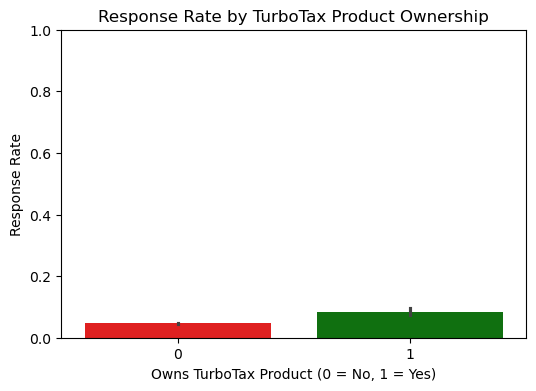

In [14]:
from scipy.stats import ttest_ind
 # Create a bar plot
plt.figure(figsize=(6, 4))


sns.barplot(x="owntaxprod", y="res1_yes", data=intuit75k, palette=["red", "green"])

    # Add labels and title
plt.xlabel("Owns TurboTax Product (0 = No, 1 = Yes)")
plt.ylabel("Response Rate")
plt.title("Response Rate by TurboTax Product Ownership")
plt.ylim(0, 1)

# Sow the chart
plt.show()

Analysis:
    
1.  TurboTax users are more engaged, making them an ideal target group for Wave-2 marketing. Personalized upgrade offers for TurboTax users 
could yield higher conversions.

2. For non-Turbotax users  Direct mail might not be the best strategy for these users; digital marketing 
  (email, retargeting ads) could be more effective. Offering a bundled QuickBooks + TurboTax discount might encourage 
   adoption and increase response rates.

## BASIC DESCRIPTIVE STATISTICS AND ANALYSIS

In [15]:
## Basic Descriptive Statitics

intuit75k.describe()

,id,zip_bins,bizflag,numords,dollars,last,sincepurch,version1,owntaxprod,upgraded,training,res1_yes
count,75000.000000,75000.000000,75000.000000,75000.000000,75000.000000,75000.000000,75000.000000,75000.00000,75000.000000,75000.000000,75000.000000,75000.000000
mean,37500.500000,10.498333,0.245080,2.076280,93.087133,15.838427,15.657173,0.21400,0.028693,0.208387,0.700000,0.048013
std,21650.779432,5.765751,0.430137,1.241355,81.205900,9.539057,10.026312,0.41013,0.166944,0.406157,0.458261,0.213796
min,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,18750.750000,5.000000,0.000000,1.000000,37.000000,8.000000,7.000000,0.00000,0.000000,0.000000,0.000000,0.000000
50%,37500.500000,10.000000,0.000000,2.000000,71.000000,15.000000,14.000000,0.00000,0.000000,0.000000,1.000000,0.000000
75%,56250.250000,15.000000,0.000000,3.000000,124.500000,24.000000,24.000000,0.00000,0.000000,0.000000,1.000000,0.000000
max,75000.000000,20.000000,1.000000,5.000000,1149.000000,36.000000,36.000000,1.00000,1.000000,1.000000,1.000000,1.000000


### **Analysis**  

1. **Total Spending in the Last 36 Hours:**  
   - Wide range in spending behavior—some users spend very little, while others spend over **$1,000**.  
   - Since high spenders exist, **personalized premium offers or up-selling** may be effective.  
   - Most customers (~75%) have spent under **$125**, indicating a **price-sensitive audience**.  
   - **Clustering customers and targeted marketing** could be a good strategy.  

2. **Number of Orders (NumOrders):**  
   - Most customers have made **1-3 purchases**, indicating they are **not frequent buyers**.  

3. **Last Purchase Timing:**  
   - Many customers haven’t purchased for **12+ months**, meaning **engagement is dropping over time**.  
   - Some users (25%) haven’t bought in over **24 months**, indicating a **potential churn risk**.  
   - **Wave-2 should prioritize recent buyers (last purchase < 12 months)** for better engagement.  

4. **Months Since First Purchase:**  
   - Shows a possible **clustering effect**.  
   - Most customers have been with the company for **1-3 years (36 months max)**.  
   - **Newer customers (≤12 months)** might need **different messaging** than long-time users.  
   - **Older customers (≥24 months)** might have **already upgraded**, so a **new product/service offer** could be more effective.  


## OUTLIER ANALYSIS

In [16]:
# Define numerical columns to check for outliers
outlier_columns = ["numords", "dollars", "last", "sincepurch"]

# Detect outliers using IQR (Interquartile Range)
outlier_data = {}
for col in outlier_columns:
    Q1 = intuit75k[col].quantile(0.25)
    Q3 = intuit75k[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = intuit75k[(intuit75k[col] < lower_bound) | (intuit75k[col] > upper_bound)][col]
    outlier_data[col] = {
        "Lower Bound": lower_bound,
        "Upper Bound": upper_bound,
        "Number of Outliers": outliers.count(),
        "Outlier Percentage": (outliers.count() / len(intuit75k)) * 100
    }

# Convert to DataFrame for better visualization
outlier_summary = pd.DataFrame(outlier_data).T

outlier_summary

,Lower Bound,Upper Bound,Number of Outliers,Outlier Percentage
numords,-2.00,6.00,0.0,0.000
dollars,-94.25,255.75,3432.0,4.576
last,-16.00,48.00,0.0,0.000
sincepurch,-18.50,49.50,0.0,0.000


Analysis

1. High-spending customers (dollars > 255.75) make up 4.58% of the dataset and should be prioritized in Wave-2 for premium offers & loyalty programs.
2. Order frequency (numords) is stable with no extreme outliers, meaning purchasing behavior is consistent across customers.
3. No extreme inactivity (last and sincepurch), so all customers remain within a reasonable engagement window.
4. Segmenting by tenure (sincepurch) can optimize targeting—new users (<12 months) need onboarding, while older users (>24 months) are better for upgrades.

For now we will keep the outliers (dollars spent) as is since:

1. These are likely high-value customers, and removing them would mean losing important insights.
2. High-spending users may have different upgrade behaviors and They should be targeted differently, not removed.
3. If required, we could probably treat them separately as we go ahead with out analysis.

## FEATURE ENGINEERING

STEP 1: Adding multiple columns which we could think of to do the preliminary analysis

In [17]:
# we're creating  new columns for the average order value, recency-frequency ratio, loyalty score, and a flag for recent buyers
intuit75k["Avg_Order_Value"] = intuit75k["dollars"] / intuit75k["numords"]
intuit75k["Recency_Frequency_Ratio"] = intuit75k["last"] / intuit75k["numords"]
intuit75k["Loyalty_Score"] = intuit75k["sincepurch"] / intuit75k["numords"]
intuit75k["Is_Recent_Buyer"] = (intuit75k["last"] < 3).astype(int)

# considering the top 25% of customers as high spenders and frequent buyers
high_spending_threshold = intuit75k["dollars"].quantile(0.75)  
frequent_buyer_threshold = intuit75k["numords"].quantile(0.75) 

# High Spending and Frequent Buyer
intuit75k["High_Spending_Customer"] = (intuit75k["dollars"] > high_spending_threshold).astype(int)
intuit75k["Frequent_Buyer"] = (intuit75k["numords"] > frequent_buyer_threshold).astype(int)

# Customer Lifetime Value (CLV)
intuit75k["Customer_Lifetime_Value"] = intuit75k["dollars"] * (1 / (intuit75k["sincepurch"] + 1))

# Demographic Features
intuit75k["Is_Male"] = (intuit75k["sex"] == "Male").astype(int)
intuit75k["Is_Unknown_Gender"] = (intuit75k["sex"] == "Unknown").astype(int)

# Response-Based Features
intuit75k["Res1_Binary"] = (intuit75k["res1"] == "Yes").astype(int)
intuit75k["Res1_Engagement_Score"] = intuit75k["Res1_Binary"] * (1 / (intuit75k["last"] + 1))

# Interaction Features
intuit75k["Has_Owned_Tax_Prod_and_Upgraded"] = intuit75k["owntaxprod"] * intuit75k["upgraded"]
intuit75k["Version1_and_Upgraded"] = intuit75k["version1"] * intuit75k["upgraded"]
intuit75k["BizFlag_Impact"] = intuit75k["bizflag"] * intuit75k["dollars"]



STEP 2: Check for Multicollinearity using VIF

In [18]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Selecting only numeric columns
numeric_cols = intuit75k.select_dtypes(include=['number']) 

# Compute VIF for numeric columns
vif_data = pd.DataFrame()
vif_data["Feature"] = numeric_cols.columns
vif_data["VIF"] = [variance_inflation_factor(numeric_cols.values, i) for i in range(len(numeric_cols.columns))]

# Display features with high VIF
print(vif_data.sort_values(by="VIF", ascending=False))


/opt/conda/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                            Feature        VIF
21                      Res1_Binary        inf
11                         res1_yes        inf
6                        sincepurch  34.311132
3                           numords  23.938161
5                              last  17.899189
4                           dollars  16.979046
14                    Loyalty_Score  15.930544
13          Recency_Frequency_Ratio  15.467296
12                  Avg_Order_Value   8.864377
1                          zip_bins   4.029761
19                          Is_Male   3.829917
7                          version1   3.820204
9                          upgraded   3.780786
0                                id   3.757475
17                   Frequent_Buyer   3.648671
16           High_Spending_Customer   3.461055
18          Customer_Lifetime_Value   3.238277
10                         training   3.172845
25                   BizFlag_Impact   3.027313
2                           bizflag   2.985285
22           

/opt/conda/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


Analysis: 

    During the feature engineering process, we observed strong multicollinearity among several newly created features. This is expected, as many of these features are derived from the same underlying columns. Specifically, high correlation was noted between the following pairs:

    1. Avg_Order_Value vs Dollars
    2️. Frequent Buyers vs Numords
    3️. High Spending Customers vs Dollars
    4️. Customer Lifetime Value (CLV) vs Dollars
    5️. Loyalty Score vs Recency Frequency Ratio vs Last

    Version1_and_Upgraded had a constant value, leading to a VIF of NaN, indicating it does not contribute meaningful variance.

    Res1_Engagement_Score - Redundant with last, adding no new value.

    Bizflag_impact: Interaction can be studied directly using the columns bizflag and dollars, no separate column is needed.

    To address these issues, we removed redundant or non-impactful features.

    


STEP 3: Dropping columns that are giving high VIF

In [19]:
# dropping columns that have high VIF

# Drop the identified multicollinear features
features_to_drop = [
    "Loyalty_Score", 
    "Frequent_Buyer", 
    "Recency_Frequency_Ratio", 
    "Avg_Order_Value", 
    "Res1_Binary", 
    "Customer_Lifetime_Value",
    "Version1_and_Upgraded",
    "BizFlag_Impact",
    "Res1_Engagement_Score"
]

intuit75k = intuit75k.drop(columns=features_to_drop)

print("Dropped the selected multicollinear features.")

Dropped the selected multicollinear features.


## MODEL PERFORMANCE BASED ON THE FEATURES ENGINEERED

### All features

In [20]:
# building logistic regression model with all the features

# Convert zip_bins to categorical
intuit75k["zip_bins"] = intuit75k["zip_bins"].astype("category")
intuit75k.info()
 
clf = rsm.model.logistic(
    data=intuit75k.query("training == 1"),
    rvar="res1",
    lev="Yes",
    evar=["numords", "version1", "upgraded", "zip_bins", "bizflag", "dollars", "last", "sincepurch",
"owntaxprod", "High_Spending_Customer",
"Has_Owned_Tax_Prod_and_Upgraded", "Is_Male", "Is_Unknown_Gender"]

)
clf.summary()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75000 entries, 0 to 74999
Data columns (total 20 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   id                               75000 non-null  int32   
 1   zip5                             75000 non-null  object  
 2   zip_bins                         75000 non-null  category
 3   sex                              75000 non-null  category
 4   bizflag                          75000 non-null  int32   
 5   numords                          75000 non-null  int32   
 6   dollars                          75000 non-null  float64 
 7   last                             75000 non-null  int32   
 8   sincepurch                       75000 non-null  int32   
 9   version1                         75000 non-null  int32   
 10  owntaxprod                       75000 non-null  int32   
 11  upgraded                         75000 non-null  int32   
 12  res1

### Selective features

Now in the current features, we have some new columns that we added based on our VIF values. Now we are just trying to remove
the new features to test, if these new features are actually creating an impact. Additionally, we also removed the sincepurch and sex column since adding and removing it was not impacting any variables OR% or AUC.

In [21]:
# rebuilding the model with selective features - removing "sincepurch", 
# "Has_Owned_Tax_Prod_and_Upgraded", "High_Spending_Customer", "Is_Male",  "Is_Unknown_Gender"

clf = rsm.model.logistic(
    data=intuit75k.query("training == 1"),
    rvar="res1",
    lev="Yes",
    evar=["numords", "version1", "upgraded", "zip_bins",  "dollars", "last", 
"owntaxprod"]

)
clf.summary()

Logistic regression (GLM)
Data                 : Not provided
Response variable    : res1
Level                : Yes
Explanatory variables: numords, version1, upgraded, zip_bins, dollars, last, owntaxprod
Null hyp.: There is no effect of x on res1
Alt. hyp.: There is an effect of x on res1

                 OR     OR%  coefficient  std.error  z.value p.value     
Intercept     0.181  -81.9%        -1.71      0.075  -22.724  < .001  ***
zip_bins[2]   0.148  -85.2%        -1.91      0.110  -17.300  < .001  ***
zip_bins[3]   0.118  -88.2%        -2.14      0.121  -17.709  < .001  ***
zip_bins[4]   0.136  -86.4%        -2.00      0.112  -17.806  < .001  ***
zip_bins[5]   0.116  -88.4%        -2.15      0.120  -17.894  < .001  ***
zip_bins[6]   0.127  -87.3%        -2.07      0.115  -18.042  < .001  ***
zip_bins[7]   0.121  -87.9%        -2.11      0.117  -17.974  < .001  ***
zip_bins[8]   0.131  -86.9%        -2.03      0.114  -17.848  < .001  ***
zip_bins[9]   0.124  -87.6%        -2.09  

Analysis: 

1. Including the additional columns, doesn't change the model performance.

2. High Spending Customers → Already captured by dollars, making it unnecessary.

3. Is_Male / Is_Unknown_Gender → No strong effect on res1, thus not contributing to predictive power.

4. While Is_Recent_Buyer and Has_Owned_Tax_Prod_and_Upgraded are conceptually valuable, they did not improve the model’s performance, leading to their exclusion.

5. This refined feature selection ensures the model remains interpretable, avoids redundancy, and prevents multicollinearity, allowing for more reliable insights and predictions.

In [22]:
# dropping columns that have high VIF

# Drop the identified multicollinear features
features_to_drop = [
    "High_Spending_Customer",
"Has_Owned_Tax_Prod_and_Upgraded", "Is_Male", "Is_Unknown_Gender"
]

intuit75k = intuit75k.drop(columns=features_to_drop)

print("Dropped the selected multicollinear features.")

Dropped the selected multicollinear features.


## CREATE A BASE MODEL FOR LOGISTIC REGRESSION (WITH ONLY SELECTED FEATURES)

In [23]:
## Ensure, data type is in the required format:

intuit75k['zip_bins'] = intuit75k['zip_bins'].astype('category')

In [24]:
## Split the data into train and test - 

intuit_train = intuit75k[intuit75k["training"] == 1]
intuit_test = intuit75k[intuit75k["training"] == 0]

In [25]:
## Lets create a model with any the features that are currently present in the dataframe:

clf = rsm.model.logistic(
    data={"intuit_train": intuit_train},
    rvar="res1_yes",
    lev=1,
    evar=['numords', 'dollars', 'last', 'version1', 'owntaxprod', 'upgraded', 'bizflag','zip_bins'],
)

clf.summary(vif=True)

Logistic regression (GLM)
Data                 : intuit_train
Response variable    : res1_yes
Level                : 1
Explanatory variables: numords, dollars, last, version1, owntaxprod, upgraded, bizflag, zip_bins
Null hyp.: There is no effect of x on res1_yes
Alt. hyp.: There is an effect of x on res1_yes

                 OR     OR%  coefficient  std.error  z.value p.value     
Intercept     0.180  -82.0%        -1.72      0.076  -22.532  < .001  ***
zip_bins[2]   0.148  -85.2%        -1.91      0.110  -17.297  < .001  ***
zip_bins[3]   0.118  -88.2%        -2.14      0.121  -17.706  < .001  ***
zip_bins[4]   0.136  -86.4%        -2.00      0.112  -17.807  < .001  ***
zip_bins[5]   0.116  -88.4%        -2.15      0.120  -17.892  < .001  ***
zip_bins[6]   0.127  -87.3%        -2.07      0.115  -18.038  < .001  ***
zip_bins[7]   0.121  -87.9%        -2.11      0.117  -17.964  < .001  ***
zip_bins[8]   0.131  -86.9%        -2.03      0.114  -17.844  < .001  ***
zip_bins[9]   0.124  -8


Key Insights from the Logistic Regression Model:

1. Overall Significance: The model is statistically significant (p < 0.001), with a reasonable AUC (0.755), meaning it has decent predictive power for identifying likely responders.

2. Geographic Impact (zip_bins): Certain ZIP code regions show significantly lower response rates, suggesting location strongly influences customer behavior.

3. Order History (numords & dollars): Customers with more past orders are more likely to respond, but total spending alone has little impact.

4. Software Version (version1): Users of older QuickBooks versions are twice as likely to upgrade, making them prime upsell targets.

5. Upgrade Behavior (upgraded): Customers who have previously upgraded are nearly 3x more likely to upgrade again, so targeting them is highly effective.

6. Recency Effect (last): The longer a business goes without purchasing, the less likely they are to respond, highlighting the need for re-engagement strategies.

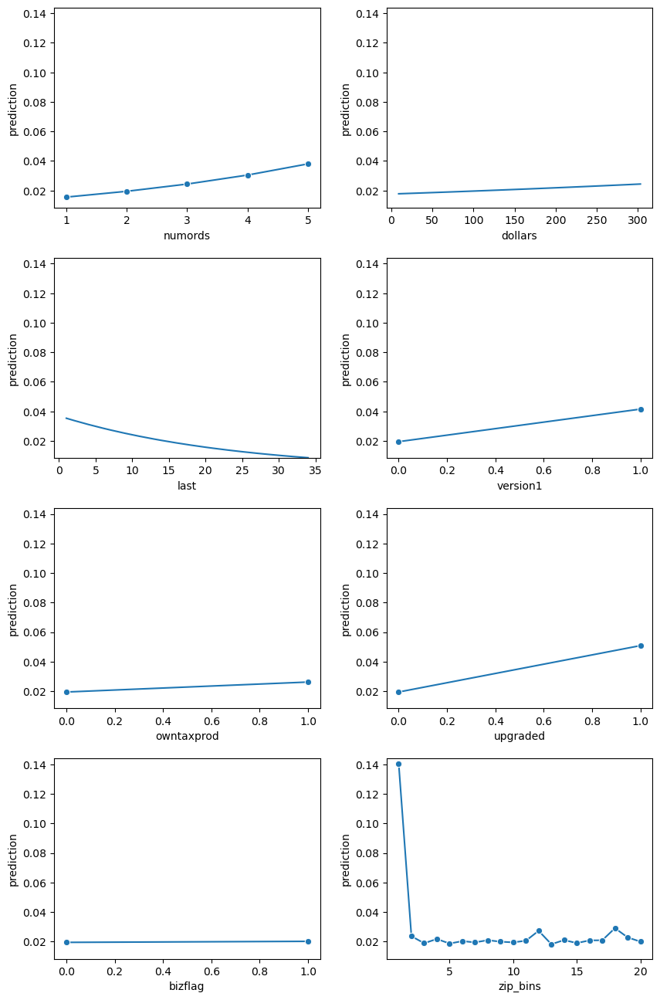

In [26]:
clf.plot("pred")

Key Takeaways from Prediction Plots:

1. Order History (numords) Positively Impacts Response: Customers with more past orders have a higher predicted response probability, reinforcing that repeat buyers are more likely to respond.

2. Recency (last) Negatively Impacts Response: The probability of response decreases as time since last purchase increases, meaning recent customers are more engaged and should be prioritized. 

3. Previous Upgraders (upgraded) Are Strongly Likely to Upgrade Again: Those who previously upgraded show a clear positive trend in response probability, making them an important target group for future campaigns. 

4. ZIP Code (zip_bins) Shows a Sharp Initial Drop in Response: Some ZIP bins have much higher response rates, but after an initial peak, most locations show very low response probabilities, indicating strong geographic influence.

5. Tax Software Ownership (owntaxprod) and Business Flag (bizflag) Have Minimal Impact: These variables show almost flat trends, meaning they do not significantly influence response probability and may not be strong predictors.

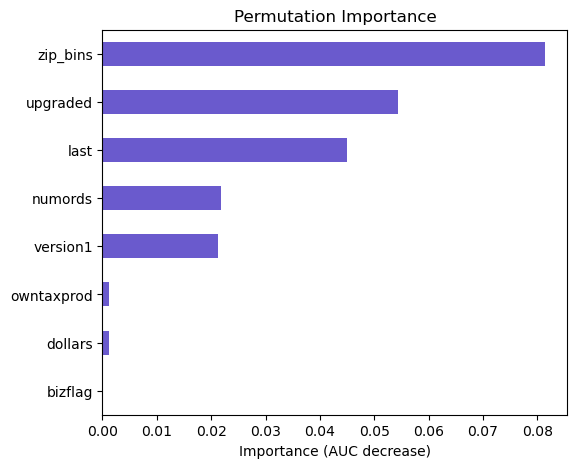

In [27]:
clf.plot('vimp')

Key Takeaways from Permutation Importance Plots:

1. Geography (zip_bins) is the most important factor, indicating strong regional variation in response rates.
2. Previous upgrades (upgraded) significantly impact response, making prior upgraders a key target group.
3. Recency (last) is crucial, with recent buyers showing higher response probabilities.
4. Order history (numords) and software version (version1) have moderate influence, making frequent buyers and older version users viable targets.
5. Tax product ownership (owntaxprod), total spending (dollars), and business classification (bizflag) have minimal impact, and can be deprioritized.

## Interaction Analysis

CHECK 1: Interaction Between bizflag and dollars

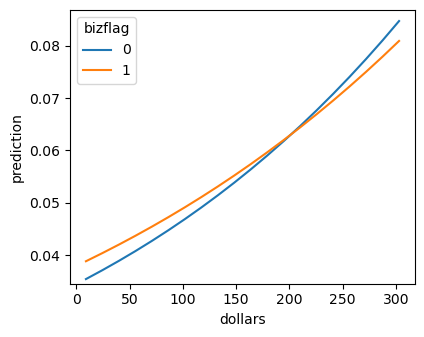

In [28]:
int_check_model = rsm.model.logistic(
    data={"intuit_train": intuit_train},
    rvar="res1_yes",
    lev=1,
    evar=["dollars", "bizflag"],
    ivar="dollars:bizflag"
)

int_check_model.plot("pred", incl=[], incl_int="dollars:bizflag")

Insight : The graph suggests a weak interaction effect between bizflag (business vs. non-business) and dollars (spending) on response 
probability. While both groups show increasing response rates with higher spending, the gap between them narrows at higher spending levels, 
indicating that spending influences response probability similarly for both businesses and individuals at higher amounts.

CHECK 2: Interaction Between owntaxprod and upgraded

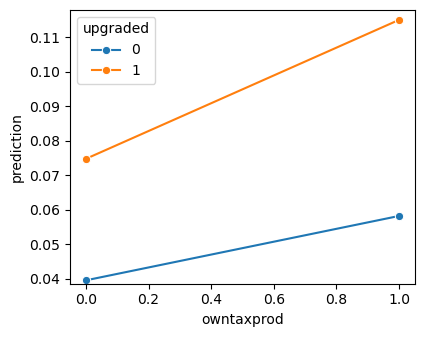

In [29]:
int_check_model2 = rsm.model.logistic(
    data={"intuit_train": intuit_train},
    rvar="res1_yes",
    lev=1,
    evar=["owntaxprod", "upgraded"],
    ivar="owntaxprod:upgraded"
)

int_check_model2.plot("pred", incl=[], incl_int="owntaxprod:upgraded")

Insight: Now based on this graph, we do not see any strong interaction - in any of the possibilities that we looked into. The best would be to go ahead with the base model itself. However, we will also perform a GridSearch CV to coe to a conclusion for the best model

STEP 2: Predict the probability of the full data

In [30]:

intuit75k["y_lr"] = clf.predict(data = intuit75k)['prediction']

intuit75k

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,owntaxprod,upgraded,res1,training,res1_yes,Is_Recent_Buyer,y_lr
0,1,94553,18,Male,0,2,109.5,5,12,0,0,0,No,1,0,0,0.045084
1,2,53190,10,Unknown,0,1,69.5,4,3,0,0,0,No,0,0,0,0.024251
2,3,37091,8,Male,0,4,93.0,14,29,0,0,1,No,0,0,0,0.087205
3,4,02125,1,Male,0,1,22.0,17,1,0,0,0,No,1,0,0,0.099163
4,5,60201,11,Male,0,1,24.5,2,3,0,0,0,No,0,0,1,0.026607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74995,74996,28205,6,Male,1,4,211.5,5,15,0,0,0,Yes,1,1,0,0.056502
74996,74997,94806,18,Male,0,1,4.5,35,34,1,0,0,No,1,0,0,0.019259
74997,74998,72958,13,Female,1,1,54.5,4,19,1,0,0,No,1,0,0,0.049127
74998,74999,29464,6,Male,0,1,69.5,20,27,0,0,1,No,1,0,0,0.033608


STEP 3: ENCODE THE VARIABLES AND BUILD THE BASE MODEL

In [31]:
## Encode the variables and build the base model:

from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression



# Select categorical variables to encode
categorical_cols = ["zip_bins", "sex"]

# Initialize One-Hot Encoder
encoder = OneHotEncoder(drop="first", sparse_output=False)
encoded_features = encoder.fit_transform(intuit75k[categorical_cols])

# Convert to DataFrame
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols))

# Drop original categorical columns and merge encoded columns
intuit75k_encoded = intuit75k.drop(columns=categorical_cols).reset_index(drop=True)
intuit75k_encoded = pd.concat([intuit75k_encoded, encoded_df], axis=1)

# Split into training features & labels
train_data = intuit75k_encoded[intuit75k_encoded["training"] == 1].drop(columns=["res1_yes", "training",'id','zip5','res1'])
train_labels = intuit75k_encoded.loc[intuit75k_encoded["training"] == 1, "res1_yes"]

# Define Logistic Regression model
lr_sklearn = LogisticRegression(max_iter=10000, random_state=1234)

lr_sklearn

LogisticRegression(max_iter=10000, random_state=1234)

STEP 4: Set the hyperparamter for tuning

In [32]:
param_grid = {"C": [1, 0.5, 0.25, 0.1, 0.05, 0.025, 0.01, 0.005, 0.0025]}
scoring = {"AUC": "roc_auc"}


STEP 5: Perform Grid Search CV to find the best Parameter

In [33]:
from sklearn.model_selection import GridSearchCV


scoring = {"AUC": "roc_auc"}


# Perform GridSearchCV
lr_cv= GridSearchCV(
    lr_sklearn, 
    param_grid, 
    scoring=scoring, 
    cv=5, 
    n_jobs=4, 
    refit="AUC", 
    verbose=5
).fit(train_data, train_labels)

# Print Best Parameters & Score
print("Best Parameters:", lr_cv.best_params_)
print("Best AUC Score:", lr_cv.best_score_)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
Best Parameters: {'C': 1}
Best AUC Score: 0.7511623679030495


Insights: It suggests that the model has reasonable predictive power, meaning it can distinguish between likely upgraders and non-upgraders fairly well.

In [34]:
## Make predictions on the tuned model for the entire dataset ()

intuit75k["y_lr_cv"] = lr_cv.best_estimator_.predict_proba(intuit75k_encoded.drop(columns=["res1_yes", "training",'id','zip5','res1']))[:, 1]



Insights: Both y_lr and y_lr_cv are very similar in value across different rows, meaning that the cross-validation did not significantly alter the predictions. This suggests that the original logistic regression (y_lr) was not heavily overfitting. Cross-validation (y_lr_cv) likely smoothed the predictions slightly, making them more generalizable.

## NEURAL NETWORK MODEL

STEP 1: Scale the selected columns before proceeding with the neural network model

In [35]:
columns_to_scale = ["dollars", "last", "sincepurch", "numords"]

# Scale only selected columns while keeping other columns intact
intuit75k = intuit75k.copy()  # Make a copy to preserve original data
intuit75k[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]] = rsm.scale_df(intuit75k[columns_to_scale], sf=1)

# Display result
intuit75k

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,res1,training,res1_yes,Is_Recent_Buyer,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale
0,1,94553,18,Male,0,2,109.5,5,12,0,...,No,1,0,0,0.045084,0.045811,0.202116,-1.136223,-0.364760,-0.061449
1,2,53190,10,Unknown,0,1,69.5,4,3,0,...,No,0,0,0,0.024251,0.023945,-0.290463,-1.241056,-1.262404,-0.867026
2,3,37091,8,Male,0,4,93.0,14,29,0,...,No,0,0,0,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704
3,4,02125,1,Male,0,1,22.0,17,1,0,...,No,1,0,0,0.099163,0.091282,-0.875400,0.121771,-1.461881,-0.867026
4,5,60201,11,Male,0,1,24.5,2,3,0,...,No,0,0,1,0.026607,0.026878,-0.844613,-1.450722,-1.262404,-0.867026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74995,74996,28205,6,Male,1,4,211.5,5,15,0,...,Yes,1,1,0,0.056502,0.058370,1.458190,-1.136223,-0.065545,1.549704
74996,74997,94806,18,Male,0,1,4.5,35,34,1,...,No,1,0,0,0.019259,0.019900,-1.090903,2.008763,1.829481,-0.867026
74997,74998,72958,13,Female,1,1,54.5,4,19,1,...,No,1,0,0,0.049127,0.050069,-0.475180,-1.241056,0.333408,-0.867026
74998,74999,29464,6,Male,0,1,69.5,20,27,0,...,No,1,0,0,0.033608,0.034413,-0.290463,0.436270,1.131314,-0.867026


Insights: Scaling is important before building neural networks. Scaling ensures that all features contribute equally to the model. Here scale_df of pyrsm has been used to scale features like dollars, last, sincepurch and numords.

In [36]:
# Add the scaled columns to intuit_train
intuit_train[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]] = intuit75k[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]]

# Display the updated DataFrame
intuit_train.head()

/tmp/ipykernel_29165/3815574782.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intuit_train[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]] = intuit75k[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]]
/tmp/ipykernel_29165/3815574782.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intuit_train[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]] = intuit75k[["dollars_scale", "last_scale", "sincepurch_scale", "numords_scale"]]
/tmp/ipykernel

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,owntaxprod,upgraded,res1,training,res1_yes,Is_Recent_Buyer,dollars_scale,last_scale,sincepurch_scale,numords_scale
0,1,94553,18,Male,0,2,109.5,5,12,0,0,0,No,1,0,0,0.202116,-1.136223,-0.364760,-0.061449
3,4,02125,1,Male,0,1,22.0,17,1,0,0,0,No,1,0,0,-0.875400,0.121771,-1.461881,-0.867026
5,6,12309,3,Male,0,1,20.0,17,17,0,0,1,No,1,0,0,-0.900028,0.121771,0.133931,-0.867026
7,8,55122,11,Male,1,1,24.5,4,17,1,0,0,No,1,0,0,-0.844613,-1.241056,0.133931,-0.867026
9,10,20036,5,Male,0,3,73.5,10,9,0,0,0,No,1,0,0,-0.241205,-0.612059,-0.663975,0.744127


STEP 2 : Create a Base Neural Network Model through pyrsm for Base understanding :

In [37]:
nnr = rsm.model.mlp(
    data={"intuit_train": intuit_train},
    rvar="res1_yes",
    evar=['numords_scale', 'dollars_scale', 'last_scale', 'version1', 'owntaxprod', 'upgraded', 'bizflag', 'zip_bins'],
    hidden_layer_sizes=(1,),
    mod_type="classification"
)

nnr.summary()

Multi-layer Perceptron (NN)
Data                 : intuit_train
Response variable    : res1_yes
Level                : None
Explanatory variables: numords_scale, dollars_scale, last_scale, version1, owntaxprod, upgraded, bizflag, zip_bins
Model type           : classification
Nr. of features      : (8, 26)
Nr. of weights       : 27
Nr. of observations  : 52,500
Hidden_layer_sizes   : (1,)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.0001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.756

Raw data             :
 numords_scale  dollars_scale  last_scale  version1  owntaxprod  upgraded  bizflag zip_bins
     -0.061449       0.202116   -1.136223         0           0         0        0       18
     -0.867026      -0.875400    0.121771         0           0         0        0        1
     -0.867026      -0.900028    0.121771         0           0         1   


Key Insights from the Neural Networks Model:

1. Performance: The model achieved an AUC of 0.756, which indicates good predictive performance.

2. A single hidden layer with one node makes the model simple, similar to logistic regression.

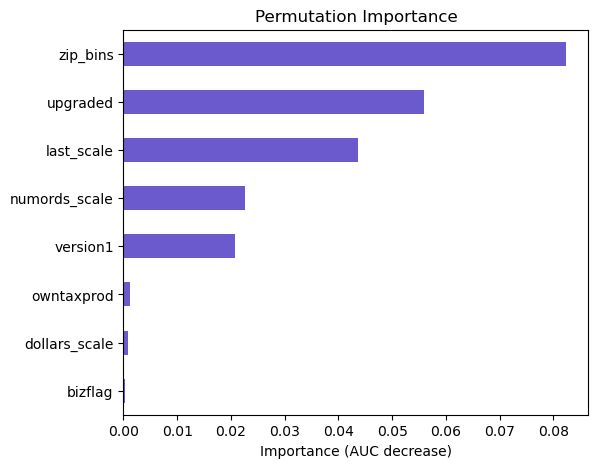

In [38]:
nnr.plot("vimp")

Comparison of Permutation Importance: Neural Network vs. Logistic Model

Similarities:
- Zip Code Segmentation (zip_bins) is the most influential feature in both models, confirming that response probability varies significantly by location.

- Upgrade History (upgraded) and Recency (last) are among the top predictors in both models, highlighting that recent and previously engaged customers are the most likely to respond.

- Number of Past Orders (numords) and QuickBooks Version (version1) hold moderate importance across both models, reinforcing that frequent buyers and v1 users remain viable targets.


Differences:
- The neural network assigns slightly more importance to upgraded and last than the logistic model, suggesting it captures non-linear effects related to past upgrades and recency more effectively.

- Numords has slightly higher importance in the logistic model, indicating a stronger linear relationship between past purchases and response probability.

- Spending (dollars) and tax product ownership (owntaxprod) have very low importance in both models, but the neural network captures a slightly stronger effect from spending.

- Bizflag, sincepurch, and sex remain the least important features in both models, confirming that business classification, gender, and customer tenure do not significantly affect response probability.

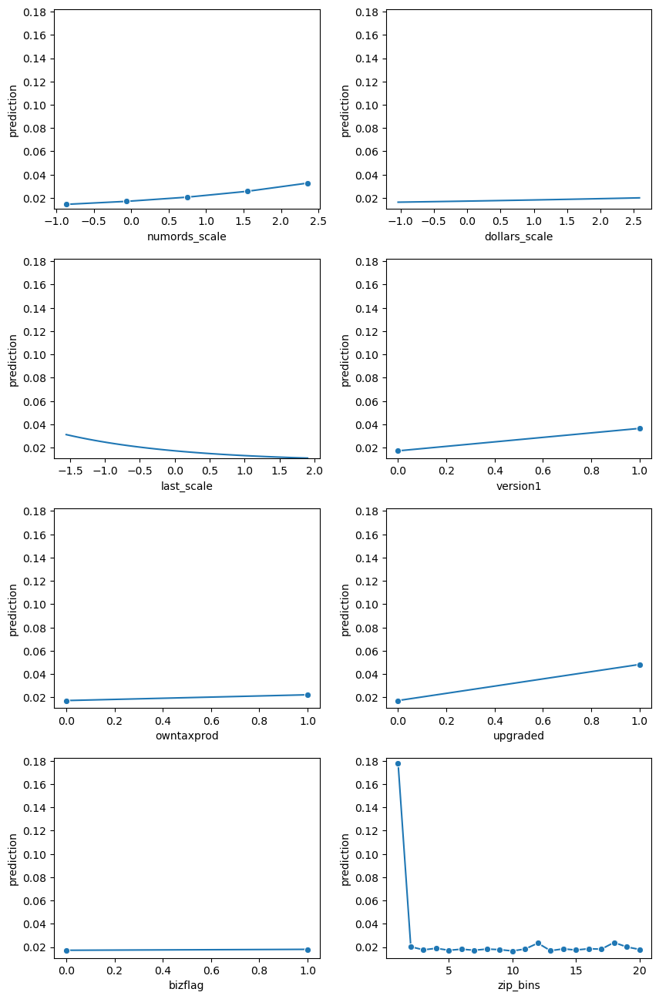

In [39]:
nnr.plot('pred')

Key Insights :
    
1. The model is a basic MLP with a single hidden neuron, behaving more like logistic regression.
2. AUC = 0.756 suggests reasonable performance, but there's room for improvement.


Comparison of Permutation Importance: Neural Network vs. Logistic Model

Similarities:
- Zip Code Segmentation (zip_bins) is the most influential feature in both models, confirming that response probability varies significantly by location.

- Upgrade History (upgraded) and Recency (last) are among the top predictors in both models, highlighting that recent and previously engaged customers are the most likely to respond.

- Number of Past Orders (numords) and QuickBooks Version (version1) hold moderate importance across both models, reinforcing that frequent buyers and v1 users remain viable targets.


Differences:
- The neural network assigns slightly more importance to upgraded and last than the logistic model, suggesting it captures non-linear effects related to past upgrades and recency more effectively.

- Numords has slightly higher importance in the logistic model, indicating a stronger linear relationship between past purchases and response probability.

- Spending (dollars) and tax product ownership (owntaxprod) have very low importance in both models, but the neural network captures a slightly stronger effect from spending.

- Bizflag, sincepurch, and sex remain the least important features in both models, confirming that business classification, gender, and customer tenure do not significantly affect response probability.

Comparison of Prediction Plots: Neural Network vs. Logistic Model

Similarities:
- Number of Past Orders (numords) shows a positive trend in both models, confirming that customers with more past purchases have a higher probability of responding.

- Recency (last) has a clear negative relationship in both models, reinforcing that more recent buyers are significantly more likely to respond.

- Upgrade History (upgraded) is a strong positive predictor across both models, confirming that previously upgraded customers are prime candidates for wave-2 targeting.

- Zip Code Segmentation (zip_bins) exhibits sharp variations in response probability in both models, highlighting strong geographical differences in customer engagement.

Differences:

- The neural network captures a slightly steeper increase in response probability for upgraded and last, indicating that it assigns greater importance to past upgrade behavior and recency.

- Dollars Spent (dollars) has a weak but slightly more noticeable effect in the neural network model, whereas in the logistic model, it remains nearly flat.

- Tax Product Ownership (owntaxprod) shows a very slight upward trend in the neural network model but remains nearly flat in the logistic model.

- Business Classification (bizflag) and Gender (sex) have no significant effect in either model, confirming their lack of influence on response probability.

Overall, both models capture the same key predictors, but the neural network assigns slightly stronger importance to recency (last) and past upgrade behavior (upgraded), whereas the logistic model maintains a more linear and gradual increase in response probability for features like numords.


STEP 3 : Predict the probability of the full data

In [40]:
## Make the Predictions on the entire data set - 

intuit75k["y_nn"] = nnr.predict(data = intuit75k)['prediction']

intuit75k

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,training,res1_yes,Is_Recent_Buyer,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale,y_nn
0,1,94553,18,Male,0,2,109.5,5,12,0,...,1,0,0,0.045084,0.045811,0.202116,-1.136223,-0.364760,-0.061449,0.039059
1,2,53190,10,Unknown,0,1,69.5,4,3,0,...,0,0,0,0.024251,0.023945,-0.290463,-1.241056,-1.262404,-0.867026,0.020190
2,3,37091,8,Male,0,4,93.0,14,29,0,...,0,0,0,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704,0.096297
3,4,02125,1,Male,0,1,22.0,17,1,0,...,1,0,0,0.099163,0.091282,-0.875400,0.121771,-1.461881,-0.867026,0.132082
4,5,60201,11,Male,0,1,24.5,2,3,0,...,0,0,1,0.026607,0.026878,-0.844613,-1.450722,-1.262404,-0.867026,0.023521
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74995,74996,28205,6,Male,1,4,211.5,5,15,0,...,1,1,0,0.056502,0.058370,1.458190,-1.136223,-0.065545,1.549704,0.055472
74996,74997,94806,18,Male,0,1,4.5,35,34,1,...,1,0,0,0.019259,0.019900,-1.090903,2.008763,1.829481,-0.867026,0.017354
74997,74998,72958,13,Female,1,1,54.5,4,19,1,...,1,0,0,0.049127,0.050069,-0.475180,-1.241056,0.333408,-0.867026,0.048946
74998,74999,29464,6,Male,0,1,69.5,20,27,0,...,1,0,0,0.033608,0.034413,-0.290463,0.436270,1.131314,-0.867026,0.031366


STEP 4: Create the base model through Sklearn to be further used for hyperparameter

In [41]:
## Encode the variables and build the base model:

from sklearn.preprocessing import OneHotEncoder
from sklearn.neural_network import MLPClassifier

# Select categorical variables to encode
categorical_cols = ["zip_bins", "sex"]

# Initialize One-Hot Encoder
encoder = OneHotEncoder(drop="first", sparse_output=False)  # Drop first category to avoid multicollinearity
encoded_features = encoder.fit_transform(intuit75k[categorical_cols])

# Convert to DataFrame
encoded_df = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(categorical_cols))

# Drop original categorical columns and merge encoded columns
intuit75k_encoded = intuit75k.drop(columns=categorical_cols).reset_index(drop=True)
intuit75k_encoded = pd.concat([intuit75k_encoded, encoded_df], axis=1)

# Split into training features & labels
train_data = intuit75k_encoded[intuit75k_encoded["training"] == 1].drop(columns=["res1_yes", "training",'id','zip5','res1'])
train_labels = intuit75k_encoded.loc[intuit75k_encoded["training"] == 1, "res1_yes"]

# Define MLP model
nnr_sklearn = MLPClassifier(max_iter=10000, random_state=1234)

nnr_sklearn

MLPClassifier(max_iter=10000, random_state=1234)

STEP 5: Set the parameters for tuning

In [42]:
## HYPERPARAMETER TUNING FOR Neural Networks 


nr_hnodes = range(1, 6)
hls = [(x, y) for x in nr_hnodes for y in nr_hnodes]


param_grid = {
    "hidden_layer_sizes": [(1,), (2,), (3,), (4,), (5,)]

}

hls

print(nr_hnodes)
print(hls)

range(1, 6)
[(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (4, 4), (4, 5), (5, 1), (5, 2), (5, 3), (5, 4), (5, 5)]


STEP 6: Perform Grid Search CV to find the best Parameter

In [43]:
## Fine Tuning the model to find the best Neural Network:


from sklearn.model_selection import GridSearchCV


scoring = {"AUC": "roc_auc"}


# Perform GridSearchCV
nnr_cv= GridSearchCV(
    nnr_sklearn, 
    param_grid, 
    scoring=scoring, 
    cv=5, 
    n_jobs=4, 
    refit="AUC", 
    verbose=5
).fit(train_data, train_labels)

# Print Best Parameters & Score
print("Best Parameters:", nnr_cv.best_params_)
print("Best AUC Score:", nnr_cv.best_score_)






Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best Parameters: {'hidden_layer_sizes': (2,)}
Best AUC Score: 0.7512159715508809


STEP 7: Rebuild the data on cross validated data

In [44]:
## Based on few of the combinations that we take from Cross Validation - we see (5,) would be the best hidden option to go ahead

nnr_cross_validated = rsm.model.mlp(
    data={"intuit_train": intuit_train},
    rvar="res1_yes",
    evar=['numords_scale', 'dollars_scale', 'last_scale', 'version1', 'owntaxprod', 'upgraded', 'bizflag',  'zip_bins'],
    hidden_layer_sizes=(5,),
    mod_type="classification"
)

nnr_cross_validated.summary()

Multi-layer Perceptron (NN)
Data                 : intuit_train
Response variable    : res1_yes
Level                : None
Explanatory variables: numords_scale, dollars_scale, last_scale, version1, owntaxprod, upgraded, bizflag, zip_bins
Model type           : classification
Nr. of features      : (8, 26)
Nr. of weights       : 135
Nr. of observations  : 52,500
Hidden_layer_sizes   : (5,)
Activation function  : tanh
Solver               : lbfgs
Alpha                : 0.0001
Batch size           : auto
Learning rate        : 0.001
Maximum iterations   : 1000000
random_state         : 1234
AUC                  : 0.775

Raw data             :
 numords_scale  dollars_scale  last_scale  version1  owntaxprod  upgraded  bizflag zip_bins
     -0.061449       0.202116   -1.136223         0           0         0        0       18
     -0.867026      -0.875400    0.121771         0           0         0        0        1
     -0.867026      -0.900028    0.121771         0           0         1  

In [45]:
## Make predictions on the tuned model for the entire dataset ()

intuit75k["y_nn_cv"] = nnr_cv.best_estimator_.predict_proba(intuit75k_encoded.drop(columns=["res1_yes", "training",'id','zip5','res1']))[:, 1]

intuit75k.head(100)

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,res1_yes,Is_Recent_Buyer,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale,y_nn,y_nn_cv
0,1,94553,18,Male,0,2,109.5,5,12,0,...,0,0,0.045084,0.045811,0.202116,-1.136223,-0.364760,-0.061449,0.039059,0.043028
1,2,53190,10,Unknown,0,1,69.5,4,3,0,...,0,0,0.024251,0.023945,-0.290463,-1.241056,-1.262404,-0.867026,0.020190,0.023746
2,3,37091,8,Male,0,4,93.0,14,29,0,...,0,0,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704,0.096297,0.113861
3,4,02125,1,Male,0,1,22.0,17,1,0,...,0,0,0.099163,0.091282,-0.875400,0.121771,-1.461881,-0.867026,0.132082,0.097614
4,5,60201,11,Male,0,1,24.5,2,3,0,...,0,1,0.026607,0.026878,-0.844613,-1.450722,-1.262404,-0.867026,0.023521,0.022942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,99352,20,Male,1,1,37.0,12,2,0,...,0,0,0.017651,0.017557,-0.690683,-0.402393,-1.362142,-0.867026,0.016915,0.018557
96,97,10014,3,Unknown,0,1,24.5,14,3,0,...,0,0,0.014587,0.014411,-0.844613,-0.192728,-1.262404,-0.867026,0.014881,0.015382
97,98,61832,12,Male,0,1,49.0,27,21,0,...,0,0,0.032824,0.032882,-0.542909,1.170100,0.532884,-0.867026,0.030288,0.034599
98,99,34234,8,Male,0,1,24.5,3,6,0,...,0,0,0.025942,0.026152,-0.844613,-1.345889,-0.963189,-0.867026,0.022575,0.025049


Key findings:

1. AUC for the cross-validated neural network (y_nn_cv) is 77% (0.775), which is higher than both the base logistic regression and the non-CV neural network. The increase in AUC means that cross-validation helped refine the model.

2. Wave-2 marketing decisions should rely on y_nn_cv rather than y_nn, as it has better predictive power.

GAINS PLOT - To help us identify the % of customers that are most likely to make an upgrade

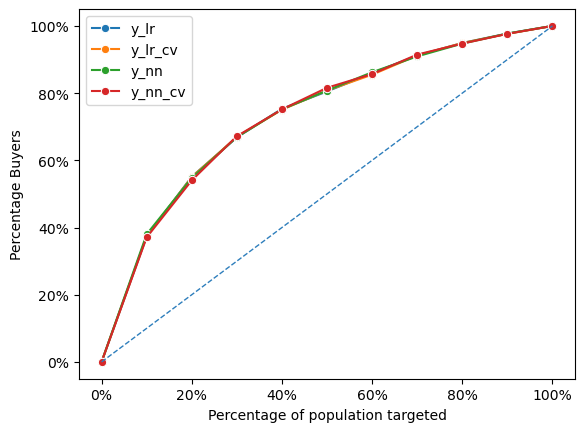

In [46]:
fig = rsm.gains_plot(intuit75k[intuit75k["training"] == 0], "res1_yes", 1, ["y_lr", "y_lr_cv", "y_nn", "y_nn_cv"])

Insights: The gains plot for all the 4 models almost overlap each other. The curves for y_lr, y_lr_cv, y_nn, and y_nn_cv overlap almost entirely, meaning that all models rank customers in a similar order. The differences in predictive power are minor in practical application. Cross-validated neural network (y_nn_cv) has a slight performance edge, making it the best choice.

Ok, now we have the probabilities for all 4 models, and we can start estimating the profit and ROME, for all models

#### LOGISTIC REGRESSION PROFIT AND ROME CALCULATION

STEP 1: For WAVE2 we will take the responses to have 50% probability to that of WAVE1

In [47]:
intuit75k['wave2_lr_predict'] = 0.5 * intuit75k['y_lr']

intuit75k

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,Is_Recent_Buyer,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale,y_nn,y_nn_cv,wave2_lr_predict
0,1,94553,18,Male,0,2,109.5,5,12,0,...,0,0.045084,0.045811,0.202116,-1.136223,-0.364760,-0.061449,0.039059,0.043028,0.022542
1,2,53190,10,Unknown,0,1,69.5,4,3,0,...,0,0.024251,0.023945,-0.290463,-1.241056,-1.262404,-0.867026,0.020190,0.023746,0.012126
2,3,37091,8,Male,0,4,93.0,14,29,0,...,0,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704,0.096297,0.113861,0.043603
3,4,02125,1,Male,0,1,22.0,17,1,0,...,0,0.099163,0.091282,-0.875400,0.121771,-1.461881,-0.867026,0.132082,0.097614,0.049581
4,5,60201,11,Male,0,1,24.5,2,3,0,...,1,0.026607,0.026878,-0.844613,-1.450722,-1.262404,-0.867026,0.023521,0.022942,0.013304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74995,74996,28205,6,Male,1,4,211.5,5,15,0,...,0,0.056502,0.058370,1.458190,-1.136223,-0.065545,1.549704,0.055472,0.066584,0.028251
74996,74997,94806,18,Male,0,1,4.5,35,34,1,...,0,0.019259,0.019900,-1.090903,2.008763,1.829481,-0.867026,0.017354,0.016656,0.009629
74997,74998,72958,13,Female,1,1,54.5,4,19,1,...,0,0.049127,0.050069,-0.475180,-1.241056,0.333408,-0.867026,0.048946,0.047240,0.024564
74998,74999,29464,6,Male,0,1,69.5,20,27,0,...,0,0.033608,0.034413,-0.290463,0.436270,1.131314,-0.867026,0.031366,0.034997,0.016804


STEP 2: Calculate the breakeven data

In [48]:
cost_per_mail = 1.41
margin = 60
breakeven = cost_per_mail / margin
breakeven

0.0235

STEP 3: Calculate the non-responders for the users

In [49]:
test_data = intuit75k[intuit75k["training"] == 0]
non_responders = test_data[test_data["res1_yes"] == 0]

mailing_list = non_responders[non_responders["wave2_lr_predict"] > breakeven]
number_of_people_to_mail = mailing_list.shape[0]
number_of_people_to_mail

6196

STEP 4: Get the response rate and the number of people who will upgrade

In [50]:
response_rate = 0.5 * (intuit75k[(intuit75k['y_lr']>breakeven) & (intuit75k['res1_yes'] == 1)].shape[0]/intuit75k[intuit75k['y_lr']>breakeven].shape[0])
response_rate

buyers = number_of_people_to_mail * response_rate
buyers


print('The response rate is',response_rate)
print('The number of buyers is',buyers)

The response rate is 0.03363219261691291
The number of buyers is 208.3850654543924


STEP 5: Calculate the Rome and profits

In [51]:
cost_lr = number_of_people_to_mail * cost_per_mail
revenue_lr = buyers * margin
profit_lr = revenue_lr - cost_lr
ROME_lr = profit_lr / cost_lr

print(f"Cost:",cost_lr)
print(f"Revenue:",revenue_lr)
print(f"Profit",profit_lr)
print(f"ROME:",ROME_lr)

Cost: 8736.359999999999
Revenue: 12503.103927263543
Profit 3766.743927263544
ROME: 0.43115713263459204


Logistic Regression Model Scaled 

In [52]:
total_wave2_target = 801821 - 38487

scale_factor = total_wave2_target / number_of_people_to_mail

scaled_buyers = buyers * scale_factor

scaled_cost = total_wave2_target * cost_per_mail
scaled_revenue = scaled_buyers * margin
scaled_profit = scaled_revenue - scaled_cost
scaled_ROME = scaled_profit / scaled_cost

# Print the scaled results
print(f"Total Wave-2 Target Size: {total_wave2_target}")
print(f"Scaled Buyers: {scaled_buyers}")
print(f"Scaled Cost: {scaled_cost}")
print(f"Scaled Revenue: {scaled_revenue}")
print(f"Scaled Profit: {scaled_profit}")
print(f"Scaled ROME: {scaled_ROME}")


Total Wave-2 Target Size: 763334
Scaled Buyers: 25672.596119038597
Scaled Cost: 1076300.94
Scaled Revenue: 1540355.7671423159
Scaled Profit: 464054.8271423159
Scaled ROME: 0.4311571326345919


#### NEURAL NETWORKS PROFIT AND ROME CALCULATION

STEP 1: For WAVE2 we will take the responses to have 50% probability to that of WAVE1

In [53]:
intuit75k['wave2_nr_predict'] = 0.5 * intuit75k['y_nn']

intuit75k

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale,y_nn,y_nn_cv,wave2_lr_predict,wave2_nr_predict
0,1,94553,18,Male,0,2,109.5,5,12,0,...,0.045084,0.045811,0.202116,-1.136223,-0.364760,-0.061449,0.039059,0.043028,0.022542,0.019530
1,2,53190,10,Unknown,0,1,69.5,4,3,0,...,0.024251,0.023945,-0.290463,-1.241056,-1.262404,-0.867026,0.020190,0.023746,0.012126,0.010095
2,3,37091,8,Male,0,4,93.0,14,29,0,...,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704,0.096297,0.113861,0.043603,0.048149
3,4,02125,1,Male,0,1,22.0,17,1,0,...,0.099163,0.091282,-0.875400,0.121771,-1.461881,-0.867026,0.132082,0.097614,0.049581,0.066041
4,5,60201,11,Male,0,1,24.5,2,3,0,...,0.026607,0.026878,-0.844613,-1.450722,-1.262404,-0.867026,0.023521,0.022942,0.013304,0.011761
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74995,74996,28205,6,Male,1,4,211.5,5,15,0,...,0.056502,0.058370,1.458190,-1.136223,-0.065545,1.549704,0.055472,0.066584,0.028251,0.027736
74996,74997,94806,18,Male,0,1,4.5,35,34,1,...,0.019259,0.019900,-1.090903,2.008763,1.829481,-0.867026,0.017354,0.016656,0.009629,0.008677
74997,74998,72958,13,Female,1,1,54.5,4,19,1,...,0.049127,0.050069,-0.475180,-1.241056,0.333408,-0.867026,0.048946,0.047240,0.024564,0.024473
74998,74999,29464,6,Male,0,1,69.5,20,27,0,...,0.033608,0.034413,-0.290463,0.436270,1.131314,-0.867026,0.031366,0.034997,0.016804,0.015683


STEP 2: Calculate the breakeven data

In [54]:
cost_per_mail = 1.41
margin = 60
breakeven = cost_per_mail / margin
breakeven

0.0235

STEP 3: Calculate the non-responders for the users

In [55]:
test_data = intuit75k[intuit75k["training"] == 0]
non_responders = test_data[test_data["res1_yes"] == 0]

mailing_list_nn = non_responders[non_responders["wave2_nr_predict"] > breakeven]
number_of_people_to_mail_nn = mailing_list_nn.shape[0]
number_of_people_to_mail_nn

5830

STEP 4: Creating the .csv file for Q2

In [56]:
# Create a new column "mailto_wave2" with default False
test_data["mailto_wave2"] = False  

# Update "mailto_wave2" for non-responders where wave2_nr_predict > breakeven
test_data.loc[test_data["res1_yes"] == 0, "mailto_wave2"] = test_data["wave2_nr_predict"] > breakeven

# Select only required columns
final_mail_list = test_data[["id", "mailto_wave2"]]


final_mail_list

/tmp/ipykernel_29165/960824141.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data["mailto_wave2"] = False


,id,mailto_wave2
1,2,False
2,3,True
4,5,False
6,7,False
8,9,False
...,...,...
74981,74982,False
74982,74983,False
74987,74988,True
74993,74994,False


In [57]:
# Assuming you have a DataFrame named 'df'
final_mail_list.to_csv("output.csv", index=False)  # Saves without the index column

# If you want to specify a different file path, you can do:
final_mail_list.to_csv("data/output.csv", index=False)

print("DataFrame has been saved as output.csv")


DataFrame has been saved as output.csv


In [58]:
non_responders[non_responders["wave2_nr_predict"] > breakeven]

,id,zip5,zip_bins,sex,bizflag,numords,dollars,last,sincepurch,version1,...,y_lr,y_lr_cv,dollars_scale,last_scale,sincepurch_scale,numords_scale,y_nn,y_nn_cv,wave2_lr_predict,wave2_nr_predict
2,3,37091,8,Male,0,4,93.0,14,29,0,...,0.087205,0.089545,-0.001073,-0.192728,1.330790,1.549704,0.096297,0.113861,0.043603,0.048149
12,13,27262,6,Male,0,1,38.0,5,22,1,...,0.049711,0.049720,-0.678368,-1.136223,0.632622,-0.867026,0.047813,0.044573,0.024855,0.023906
19,20,36609,8,Male,0,2,34.0,1,30,0,...,0.090799,0.093789,-0.727626,-1.555555,1.430528,-0.061449,0.100546,0.109459,0.045400,0.050273
46,47,19033,4,Female,1,3,160.0,1,5,0,...,0.054405,0.056492,0.823996,-1.555555,-1.062928,0.744127,0.051952,0.056176,0.027202,0.025976
54,55,15090,4,Male,0,3,315.5,6,35,1,...,0.103487,0.106799,2.738894,-1.031390,1.929219,0.744127,0.107493,0.155100,0.051743,0.053747
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74924,74925,70810,12,Male,0,4,200.5,10,20,1,...,0.119500,0.117897,1.322731,-0.612059,0.433146,1.549704,0.130298,0.183590,0.059750,0.065149
74964,74965,76643,13,Female,0,2,136.5,2,22,0,...,0.084874,0.088506,0.534606,-1.450722,0.632622,-0.061449,0.094736,0.109308,0.042437,0.047368
74979,74980,98022,20,Male,1,1,24.5,3,31,1,...,0.054232,0.055439,-0.844613,-1.345889,1.530266,-0.867026,0.054787,0.049751,0.027116,0.027393
74987,74988,80501,15,Female,0,4,94.5,7,23,1,...,0.086737,0.089545,0.017399,-0.926558,0.732361,1.549704,0.096352,0.100008,0.043369,0.048176


STEP 5: Get the response rate and the number of people who will upgrade

In [59]:
response_rate_nn = 0.5 * (intuit75k[(intuit75k['y_nn']>breakeven) & (intuit75k['res1_yes'] == 1)].shape[0]/intuit75k[intuit75k['y_nn']>breakeven].shape[0])
response_rate_nn

buyers_nn = number_of_people_to_mail_nn * response_rate_nn
buyers_nn


print('The response rate is',response_rate_nn)
print('The number of buyers is',buyers_nn)

The response rate is 0.03545671683324444
The number of buyers is 206.71265913781508


STEP 6: Calculate the Rome and profits

In [60]:
cost_nn = number_of_people_to_mail_nn * cost_per_mail
revenue_nn = buyers_nn * margin
profit_nn = revenue_nn - cost_nn
ROME_nn = profit_nn / cost_nn

print(f"Cost:",cost_nn)
print(f"Revenue:",revenue_nn)
print(f"Profit",profit_nn)
print(f"ROME:",ROME_nn)

Cost: 8220.3
Revenue: 12402.759548268905
Profit 4182.459548268906
ROME: 0.5087964609891252


Neural Network Model Scaled 

In [61]:
total_wave2_target = 801821 - 38487

scale_factor_nn = total_wave2_target / number_of_people_to_mail_nn

scaled_buyers_nn = buyers_nn * scale_factor_nn

scaled_cost_nn = total_wave2_target * cost_per_mail
scaled_revenue_nn = scaled_buyers_nn * margin
scaled_profit_nn = scaled_revenue_nn - scaled_cost_nn
scaled_ROME_nn = scaled_profit_nn / scaled_cost_nn

# Print the scaled results
print(f"Total Wave-2 Target Size: {total_wave2_target}")
print(f"Scaled Buyers: {scaled_buyers_nn}")
print(f"Scaled Cost: {scaled_cost_nn}")
print(f"Scaled Revenue: {scaled_revenue_nn}")
print(f"Scaled Profit: {scaled_profit_nn}")
print(f"Scaled ROME: {scaled_ROME_nn}")

Total Wave-2 Target Size: 763334
Scaled Buyers: 27065.31748718781
Scaled Cost: 1076300.94
Scaled Revenue: 1623919.0492312687
Scaled Profit: 547618.1092312688
Scaled ROME: 0.5087964609891252


### SPAM ALL - CASE

STEP 1: Calculate the response rate for spam all

In [62]:
response_rate_for_all_spam = 0.5 * intuit75k['res1_yes'].mean()
response_rate_for_all_spam

0.024006666666666666

STEP 2: Find the number of buyers for Spam all

In [63]:
buyers_spam_all = non_responders.shape[0] * response_rate_for_all_spam
buyers_spam_all

513.6706466666667

STEP 3: Calculate PROFIT AND ROME for spam all

In [64]:
cost_spam = non_responders.shape[0] * cost_per_mail
revenue_spam = buyers_spam_all * margin
profit_spam = revenue_spam - cost_spam
ROME_spam = profit_spam / cost_spam

print(f"Cost:",cost_spam)
print(f"Revenue:",revenue_spam)
print(f"Profit:",profit_spam)
print(f"ROME:",ROME_spam)

Cost: 30169.769999999997
Revenue: 30820.238800000003
Profit: 650.468800000006
ROME: 0.021560283687943466


STEP 4: Spam all (Scaled)

In [65]:
total_wave2_target = 801821 - 38487

scale_factor_spam = total_wave2_target / non_responders.shape[0]

scaled_buyers_spam = buyers_spam_all * scale_factor_spam

scaled_cost_spam = total_wave2_target * cost_per_mail
scaled_revenue_spam = scaled_buyers_spam * margin
scaled_profit_spam = scaled_revenue_spam - scaled_cost_spam
scaled_ROME_spam = scaled_profit_spam / scaled_cost_spam

# Print the scaled results
print(f"Scaled Buyers: {scaled_buyers_spam}")
print(f"Scaled Cost: {scaled_cost_spam}")
print(f"Scaled Revenue: {scaled_revenue_spam}")
print(f"Scaled Profit: {scaled_profit_spam}")
print(f"Scaled ROME: {scaled_ROME_spam}")

Scaled Buyers: 18325.104893333337
Scaled Cost: 1076300.94
Scaled Revenue: 1099506.2936000002
Scaled Profit: 23205.353600000264
Scaled ROME: 0.021560283687943507


Profit and Rome Analysis FOR ALL THE THREE

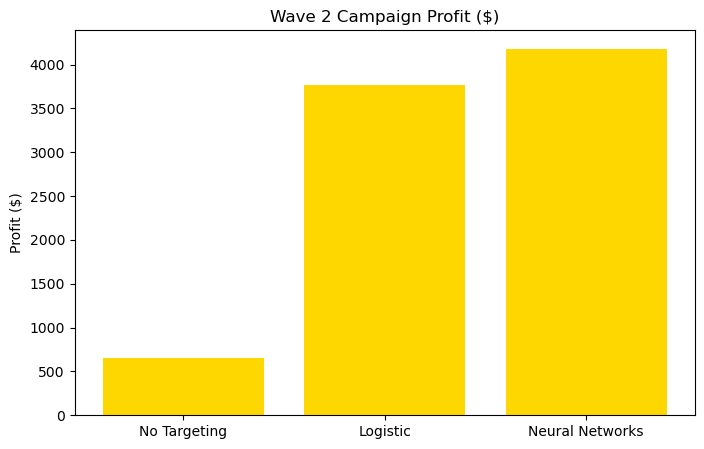

In [66]:
import matplotlib.pyplot as plt

# Data for the charts
categories = ["No Targeting", "Logistic","Neural Networks"]
profits = [profit_spam, profit_lr,profit_nn]  # Profits from Question 12 and 13 analyses

# Profit Bar Chart
plt.figure(figsize=(8, 5))
plt.bar(categories, profits, color="#FFD700")
plt.title("Wave 2 Campaign Profit ($)")
plt.ylabel("Profit ($)")

plt.show()

Insights: Targeted Marketing is significantly more profitable than no targeting. The "No Targeting" approach yields the lowest profit, meaning that mass emailing without prediction-based targeting is inefficient. Neural networks outperform logistic regression, generating the highest campaign profit. Logistic regression still generates strong returns and is a viable alternative if simplicity is preferred.

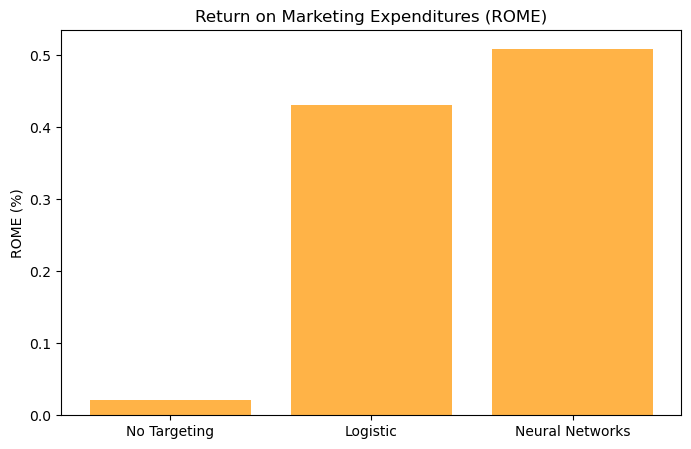

In [67]:
import matplotlib.pyplot as plt

# Data for the charts
categories = ["No Targeting", "Logistic","Neural Networks"]
profits = [ROME_spam,ROME_lr,ROME_nn]  # Profits from Question 12 and 13 analyses

# Profit Bar Chart
plt.figure(figsize=(8, 5))
plt.bar(categories, profits, color="#FFB347")
plt.title("Return on Marketing Expenditures (ROME)")
plt.ylabel("ROME (%)")

plt.show()

Insights: The No Targeting approach has almost negligible ROME, indicating that mass marketing is not cost-effective. Logistic Regression achieves a significantly higher ROME than No Targeting. Neural Networks perform the best, producing the highest ROME, meaning they maximize marketing efficiency.

### Conclusion

Neural networks should be the preferred approach for maximizing marketing returns.

# Q5 Group 9: Anjana Khabir, Kush Desai, Shruthi Suresh, Nadifa Hossain

## Problem Statement
**Identify and target persuadable customers from the Wave-1 non-responder group to optimize the Wave-2 marketing upsell campaign.**

---

## Introduction
In the **Wave-1 campaign**, **801,821 business customers** were targeted, but not all upgraded. From a **random sample of 75,000**, we aim to identify those **most likely to upgrade in Wave-2**.  
Instead of mass emailing, we seek a **targeted approach** to reduce costs, minimize annoyance, and maximize profitability.  
Using **logistic regression and neural networks** (with and without interaction terms, and new features), we'll segment persuadable customers and compare **targeted marketing to mass outreach**.  

Our **final recommendation** will be based on:
- **Predictive performance**
- **Response rates**
- **Profitability**

---

## Exploratory Data Analysis

Our dataset consists of **75,000 records**, with **22,500 initially designated as test data**.

### **Key Findings**
- **Data Integrity:** No missing values, ensuring a complete dataset.
- **Distributions & Visualizations:**  
  - Purchase amounts (`dollars`) are **right-skewed**, meaning most customers spend less.  
  - Recent purchases **increase upgrade likelihood**.  
  - **Overall engagement is declining over time**.
- **Correlation Analysis:**  
  - No extreme **multicollinearity**.  
  - **Tenure influences upgrade decisions**, with long-term customers either staying or upgrading.
- **Customer Segmentation:**  
  - **High-value customers respond at higher rates** and should be prioritized.  
  - **TurboTax users** show **strong engagement**, making them an ideal target.
- **Gender & Response Rates:** No significant difference → **Gender should not be a key targeting factor**.
- **Outlier Analysis:** **4.58% high-spending customers** will be retained for insights into premium behavior.

**Takeaways:**  
✔ Prioritize **recent and high-value customers** in Wave-2 marketing.  
✔ **Gender is not a key factor** in targeting.  
✔ **Segmenting customers by tenure and spending** can enhance targeting.  
✔ **Re-engagement strategies** are crucial as overall engagement declines.

---

## Feature Engineering

We tested **multiple new features** aligned with customer behavior but found issues:
- **Multicollinearity** made some features redundant.
- Some new variables **strongly correlated** with existing ones, adding **no new value**.
- **Removing unnecessary features did not reduce model performance**.

### **Dropped Features (Multicollinearity & Redundancy)**
- `Avg_Order_Value (dollars/numords)` – Already captured in `dollars`
- `Is_Recent_Buyer` (purchases in last 3 months) – Overlaps with `numords`
- `Loyalty Score / Recency Frequency Ratio` – Overlapping with `last`
- `Real_Engagement_Score` – Provided no additional value beyond `last`
- `Version1_and_Upgraded` – Constant value, no variance
- `Has_Owned_Tax_Prod_and_Upgraded` – Already captured in other features
- `High_Spending_Customer, CLV, Is_Male / Is_Unknown_Gender` – Minimal improvement

✔ **We focused on the most meaningful variables**, ensuring the model remains **interpretable and effective**.

---

## Interactions
- Interaction plots were analyzed to see if adding **interaction terms** improves predictions.
- **The interaction between `bizflag` and `upgraded` showed a moderate effect** but was **insignificant in terms of p-value and performance**.
- **Conclusion:** **The base model without interactions was sufficient**.

---

## Modeling

### **1. Overview of Predictive Modeling**
Our goal was to **predict which businesses from Wave-1 non-responders** are **most likely to upgrade in Wave-2**.  
We developed models using **Logistic Regression and Neural Networks**, leveraging **historical purchase behavior and business attributes** to optimize marketing.

### **2. Model Development**
#### **Logistic Regression Model**
- Predicted **response probability (`res1_yes`)** based on:
  - **Purchase Behavior:** `numords`, `dollars`, `last`
  - **Product Indicators:** `version1`, `owntaxprod`, `upgraded`
  - **Geographic Attributes:** `zip_bins`
  - **Interaction Effects:** `dollars:bizflag` and `owntaxprod:upgraded`
- **Multicollinearity was assessed using Variance Inflation Factor (VIF)** → No severe correlations found.
- **Final AUC:** **0.755** (Good predictive power)

#### **Neural Network Model**
- Implemented a **Multi-Layer Perceptron (MLP)** to capture **non-linear relationships**.
- **Best performing network:**  
  - **1 hidden layer (5 neurons)**  
  - **Tanh activation function**
- **Final AUC:** **0.775** (Slightly better than logistic regression)

---

## **3. Model Comparison & Evaluation**
| Model                      | AUC Score | Interpretability | Feature Importance | Decision |
|----------------------------|----------|-----------------|--------------------|-----------|
| **Logistic Regression**     | 0.755    | High            | `zip_bins`, `upgraded`, `last` | No |
| **Logistic Regression (CV)**| 0.751    | High            | Similar to LR      | No |
| **Neural Network**          | 0.756    | Moderate        | Captures 



## Selection Criteria for Wave-2 Mailing
To determine whom to target in Wave-2, we followed these steps:

1. **Filtered test set non-responders** (`res1_yes = 0`).
2. **Computed predicted response probabilities** using logistic regression.
3. **Applied the breakeven threshold (0.0235)** to filter businesses where expected profit exceeds mailing cost.
4. **Selected 5,830 businesses** for the Wave-2 mailing based on predicted response rates.

---

## Expected Profit Estimation for Wave-2
Based on our best model, **Neural Networks**, below is the **final profit and ROME Analysis**:

- **Response Rate (scaled):** **3.55%**
- **Buyers in Wave-2:** **~206 expected responders**
- **Total Cost:** **$8,220**
- **Total Revenue:** **$12,402**
- **Projected Profit:** **$4,182**
- **Return on Marketing Expenditure (ROME):** **50.8%**

---

## Key Learnings About Business Upgrade Behavior
- **Business vs. Individual:**  
  `bizflag` had **minimal impact**, meaning businesses and individuals exhibited **similar response behaviors**.
- **Past Upgraders Respond More:**  
  Businesses that **previously upgraded** had a significantly **higher likelihood of responding**.
- **Spending History Alone is Weak:**  
  `dollars` had a **low correlation** with response, indicating that **spending alone does not predict upgrade likelihood**.

---

## Conclusion

Our analysis identified the most persuadable customers from the Wave-1 non-responders to optimize the Wave-2 marketing campaign. Instead of mass emailing, we used predictive modeling (Logistic Regression & Neural Networks) to target high-potential customers, reducing costs and improving efficiency. The Neural Network model (AUC 0.775) outperformed logistic regression and helped us select 5,830 businesses most likely to upgrade, maximizing response rates and profitability. Key insights show that past upgraders are more likely to respond, while spending history alone is not a strong predictor. By implementing a data-driven approach, we expect a 50.8% return on marketing expenditure (ROME), ensuring a smarter, cost-effective strategy for Wave-2.


# Q9 :**Using ChatGPT for Model Optimization and Data Analysis**

## **Specific Examples of Prompts Used**  
- *"How is Grid Search used for tuning hidden layers in a neural network?"*  
- *"Provide Python code to implement Grid Search for MLP hidden layers in sklearn."*  
- *"How do I scale and unscale selected columns in a dataset?"*  
- *"Can you extend the code to provide a comprehensive list of pairs up to (5,5)?"*  

---

## **How AI Responses Helped or Hindered Understanding**  

### **Helped:**  
The AI provided **clear, well-structured explanations**, improving readability and efficiency.  
**Refined responses**, making them more concise and insightful.  
Provided **useful insights** into **AUC (Area Under the Curve)** and its role in **model selection for Wave-2 targeting**.  
Explained **cross-validation and Grid Search** effectively for **model building and selection**.  
Assisted with **projected profit and ROME (Return on Marketing Expenditure) calculations**.  

### **Hindered:**  
At times, the AI offered **overly simplified** responses.  
It **did not always fully understand our specific context** without additional clarification.  
Some responses **contained irrelevant third-party data**, requiring **careful verification**.  
ChatGPT occasionally provided **generic answers** that needed **refinement**.  
Losing ongoing conversation history **forced re-explanations**, reducing workflow efficiency.  
Some **suggested solutions were suboptimal** and needed tweaking for specific use cases.  

---

## **How AI Complemented the Process**  
Using ChatGPT was a **valuable tool** in supporting:  
**Model optimization**  
**Data preprocessing**  
**Code generation and debugging**  

It provided **logical explanations and code snippets**, enhancing **efficiency and workflow**. However, **human oversight was essential** to:  
- Validate responses  
- Refine methodologies  
- Ensure alignment with **business objectives**  

By using **ChatGPT as an assistive tool rather than a complete solution**, we were able to:  
Broaden our understanding  
Critically evaluate outputs  
Improve our approach to **prompt engineering and validation**  

### **Future Improvements**  
Moving forward, we plan to **refine our approach to prompt engineering and response validation** to further enhance our learning experience and model optimization.



